In [113]:
import pandas as pd
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
import numpy as np
from sklearn.preprocessing import LabelEncoder
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import plotly.express as px

In [114]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 12
matplotlib.rcParams['figure.figsize'] = (14, 8)
matplotlib.rcParams['figure.facecolor'] = '#000000'

In [115]:
df = pd.read_csv('./dataset/stircom.csv')

In [116]:
df

,ID,town,country,age,job,married,education,arrears,current_balance,housing,has_tv_package,last_contact,conn_tr,last_contact_this_campaign_day,last_contact_this_campaign_month,this_campaign,days_since_last_contact_previous_campaign,contacted_during_previous_campaign,outcome_previous_campaign,new_contract_this_campaign
0,32390233,Bristol,UK,39,management,married,tertiary,no,-1.90,no,yes,unknown,4,11,jun,8,-1,0,unknown,yes
1,41226029,Basildon,UK,53,housemaid,married,primary,no,3.62,no,no,cellular,1,28,jul,2,-1,0,unknown,yes
2,85498057,Blackburn,UK,79,retired,divorced,primary,no,27.87,no,no,telephone,3,13,jul,1,377,1,success,yes
3,76539627,Oldham,UK,43,services,single,secondary,no,5.50,yes,no,cellular,3,13,may,2,-1,0,unknown,no
4,76290986,Middlesbrough,UK,35,technician,single,secondary,no,3.44,no,no,cellular,2,27,aug,16,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50657,60912498,Glasgow,UK,31,management,single,tertiary,no,4.99,yes,no,unknown,3,9,jun,2,-1,0,unknown,no
50658,70632237,Chester,UK,31,technician,single,tertiary,no,6.65,yes,no,cellular,1,4,feb,1,-1,0,unknown,no
50659,14476386,Bolton,UK,60,retired,divorced,tertiary,no,4.39,no,yes,cellular,4,25,may,1,321,1,failure,yes
50660,63746806,Birmingham,UK,32,blue-collar,single,secondary,no,30.36,yes,no,cellular,5,31,jul,5,-1,0,unknown,no


In [117]:
fig  = px.histogram(df, x= 'ID', marginal='box', nbins=60, title='ID Distribution')
fig.update_layout(bargap=0.1)
fig.show()

In [118]:
df.drop(columns=['ID', 'town', 'country', 'last_contact_this_campaign_day', 'last_contact_this_campaign_month'])

,age,job,married,education,arrears,current_balance,housing,has_tv_package,last_contact,conn_tr,this_campaign,days_since_last_contact_previous_campaign,contacted_during_previous_campaign,outcome_previous_campaign,new_contract_this_campaign
0,39,management,married,tertiary,no,-1.90,no,yes,unknown,4,8,-1,0,unknown,yes
1,53,housemaid,married,primary,no,3.62,no,no,cellular,1,2,-1,0,unknown,yes
2,79,retired,divorced,primary,no,27.87,no,no,telephone,3,1,377,1,success,yes
3,43,services,single,secondary,no,5.50,yes,no,cellular,3,2,-1,0,unknown,no
4,35,technician,single,secondary,no,3.44,no,no,cellular,2,16,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50657,31,management,single,tertiary,no,4.99,yes,no,unknown,3,2,-1,0,unknown,no
50658,31,technician,single,tertiary,no,6.65,yes,no,cellular,1,1,-1,0,unknown,no
50659,60,retired,divorced,tertiary,no,4.39,no,yes,cellular,4,1,321,1,failure,yes
50660,32,blue-collar,single,secondary,no,30.36,yes,no,cellular,5,5,-1,0,unknown,no


In [119]:
fig  = px.histogram(df, x= 'age', marginal='box', nbins=60, title='Age Distribution')
fig.update_layout(bargap=0.1)
fig.show()

In [120]:
fig  = px.histogram(df, x= 'last_contact_this_campaign_day', marginal='box', nbins=40, color_discrete_sequence=['green'], title='Campaign Day Distribution')
fig.update_layout(bargap=0.1)
fig.show()

In [121]:
fig  = px.histogram(df, x= 'last_contact_this_campaign_month', marginal='box', nbins=12, color_discrete_sequence=['red'], title='Campaign Month Distribution')
fig.update_layout(bargap=0.1)
fig.show()

In [122]:
fig  = px.histogram(df, x= 'country', marginal='box', nbins=12, color_discrete_sequence=['purple'], title='Campaign Country Distribution')
fig.update_layout(bargap=0.1)
fig.show()

In [123]:
fig  = px.histogram(df, x= 'town', marginal='box', nbins=12, color_discrete_sequence=['red'], title='Campaign Town Distribution')
fig.update_layout(bargap=0.1)
fig.show()

In [124]:
fig  = px.histogram(df, x ='this_campaign', marginal='box', color='outcome_previous_campaign', color_discrete_sequence=['red', 'green', 'blue', 'purple'], title='This Campaign Compared to Last Campaign')
fig.update_layout(bargap=0.1)
fig.show()

In [125]:
ordinal_cols = ['married', 'arrears', 'housing', 'has_tv_package', 'last_contact', 'new_contract_this_campaign']
ohe_cols = ['job', 'education', 'last_contact', 'outcome_previous_campaign']

In [126]:
df_org = df.copy()

In [127]:
for column in df.columns:
    if df[column].dtype == np.number:
        continue
    df[column] = LabelEncoder().fit_transform(df[column])

<ipython-input-127-0134b5f5b5b2>:2: DeprecationWarning:

Converting `np.inexact` or `np.floating` to a dtype is deprecated. The current result is `float64` which is not strictly correct.



In [128]:
df

,ID,town,country,age,job,married,education,arrears,current_balance,housing,has_tv_package,last_contact,conn_tr,last_contact_this_campaign_day,last_contact_this_campaign_month,this_campaign,days_since_last_contact_previous_campaign,contacted_during_previous_campaign,outcome_previous_campaign,new_contract_this_campaign
0,12590,15,3,21,4,1,2,0,-1.90,0,2,3,3,10,7,7,0,0,3,1
1,17530,2,3,35,3,1,0,0,3.62,0,1,1,0,27,6,1,0,0,3,1
2,42520,9,3,61,5,0,0,0,27.87,0,1,2,2,12,6,0,371,1,2,1
3,37430,62,3,25,7,2,1,0,5.50,1,1,1,2,12,9,1,0,0,3,0
4,37268,54,3,17,9,2,1,0,3.44,0,1,1,1,26,1,15,0,0,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50657,28643,35,3,13,4,2,2,0,4.99,1,1,3,2,8,7,1,0,0,3,0
50658,34066,20,3,13,9,2,2,0,6.65,1,1,1,0,3,3,0,0,0,3,0
50659,2523,11,3,42,5,0,2,0,4.39,0,2,1,3,24,9,0,315,1,0,1
50660,30207,8,3,14,1,2,1,0,30.36,1,1,1,4,30,6,4,0,0,3,0


Text(0.5, 1.0, 'Correlation Matrix')

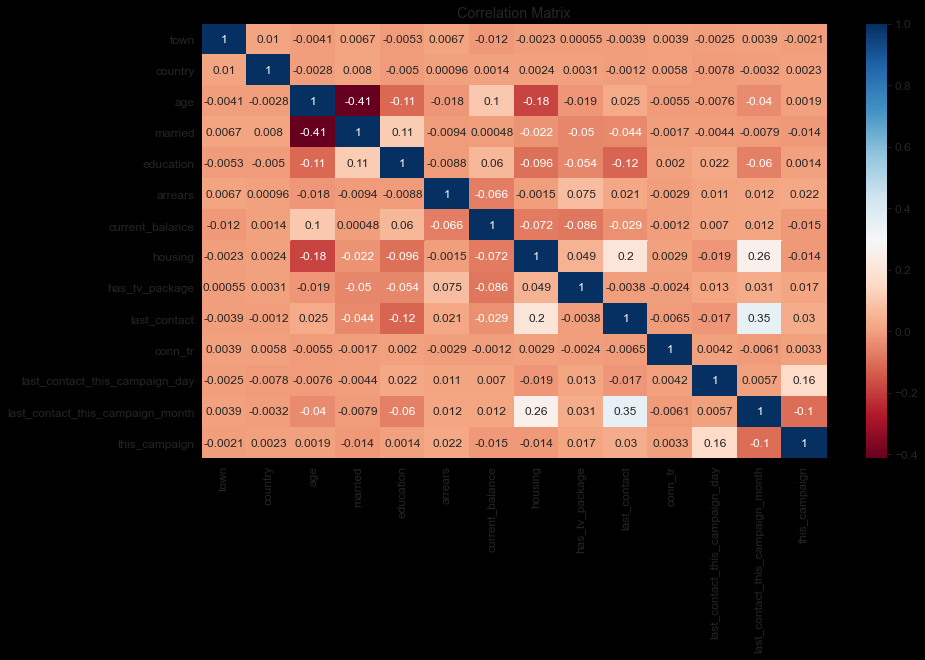

In [129]:
correlation_features = ['town', 'country', 'age', 'married', 'education', 'arrears', 'current_balance', 'housing', 
                        'has_tv_package', 'last_contact', 'conn_tr', 'last_contact_this_campaign_day', 'last_contact_this_campaign_month', 'this_campaign']
sns.heatmap(df[correlation_features].corr(), cmap='RdBu', annot=True)
plt.title('Correlation Matrix')

In [130]:
df.isnull().sum()

ID                                           0
town                                         0
country                                      0
age                                          0
job                                          0
married                                      0
education                                    0
arrears                                      0
current_balance                              0
housing                                      0
has_tv_package                               0
last_contact                                 0
conn_tr                                      0
last_contact_this_campaign_day               0
last_contact_this_campaign_month             0
this_campaign                                0
days_since_last_contact_previous_campaign    0
contacted_during_previous_campaign           0
outcome_previous_campaign                    0
new_contract_this_campaign                   0
dtype: int64

In [131]:
df_org

,ID,town,country,age,job,married,education,arrears,current_balance,housing,has_tv_package,last_contact,conn_tr,last_contact_this_campaign_day,last_contact_this_campaign_month,this_campaign,days_since_last_contact_previous_campaign,contacted_during_previous_campaign,outcome_previous_campaign,new_contract_this_campaign
0,32390233,Bristol,UK,39,management,married,tertiary,no,-1.90,no,yes,unknown,4,11,jun,8,-1,0,unknown,yes
1,41226029,Basildon,UK,53,housemaid,married,primary,no,3.62,no,no,cellular,1,28,jul,2,-1,0,unknown,yes
2,85498057,Blackburn,UK,79,retired,divorced,primary,no,27.87,no,no,telephone,3,13,jul,1,377,1,success,yes
3,76539627,Oldham,UK,43,services,single,secondary,no,5.50,yes,no,cellular,3,13,may,2,-1,0,unknown,no
4,76290986,Middlesbrough,UK,35,technician,single,secondary,no,3.44,no,no,cellular,2,27,aug,16,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50657,60912498,Glasgow,UK,31,management,single,tertiary,no,4.99,yes,no,unknown,3,9,jun,2,-1,0,unknown,no
50658,70632237,Chester,UK,31,technician,single,tertiary,no,6.65,yes,no,cellular,1,4,feb,1,-1,0,unknown,no
50659,14476386,Bolton,UK,60,retired,divorced,tertiary,no,4.39,no,yes,cellular,4,25,may,1,321,1,failure,yes
50660,63746806,Birmingham,UK,32,blue-collar,single,secondary,no,30.36,yes,no,cellular,5,31,jul,5,-1,0,unknown,no


In [132]:
df_new = df_org.drop(columns=['ID', 'town', 'country', 'last_contact_this_campaign_day', 'last_contact_this_campaign_month'])

In [133]:
df_new.columns

Index(['age', 'job', 'married', 'education', 'arrears', 'current_balance',
       'housing', 'has_tv_package', 'last_contact', 'conn_tr', 'this_campaign',
       'days_since_last_contact_previous_campaign',
       'contacted_during_previous_campaign', 'outcome_previous_campaign',
       'new_contract_this_campaign'],
      dtype='object')

In [134]:
df_new.drop(columns='new_contract_this_campaign')
feature = df_new['new_contract_this_campaign']

In [135]:
feature_df = pd.DataFrame(data=feature)

In [136]:
ordinal = OrdinalEncoder()

ordinal_feature = ordinal.fit_transform(feature_df)

In [137]:
ordinal_feature

array([[1.],
       [1.],
       [1.],
       ...,
       [1.],
       [0.],
       [0.]])

In [138]:
numerical_cols = df_new.select_dtypes(include=np.number).columns.tolist()
categorical_cols = df_new.select_dtypes('object').columns.tolist()

In [139]:
numerical_cols

['age',
 'current_balance',
 'conn_tr',
 'this_campaign',
 'days_since_last_contact_previous_campaign',
 'contacted_during_previous_campaign']

In [140]:
categorical_cols

['job',
 'married',
 'education',
 'arrears',
 'housing',
 'has_tv_package',
 'last_contact',
 'outcome_previous_campaign',
 'new_contract_this_campaign']

In [141]:
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore').fit(df_new[categorical_cols])
encoded_cols = list(encoder.get_feature_names(categorical_cols))
df_new[encoded_cols] = encoder.transform(df_new[categorical_cols])

In [142]:
df_all = df_new[numerical_cols + encoded_cols]

In [143]:
df_all.columns

Index(['age', 'current_balance', 'conn_tr', 'this_campaign',
       'days_since_last_contact_previous_campaign',
       'contacted_during_previous_campaign', 'job_admin.', 'job_blue-collar',
       'job_entrepreneur', 'job_housemaid', 'job_management', 'job_retired',
       'job_self-employed', 'job_services', 'job_student', 'job_technician',
       'job_unemployed', 'job_unknown', 'married_divorced', 'married_married',
       'married_single', 'education_primary', 'education_secondary',
       'education_tertiary', 'education_unknown', 'arrears_no', 'arrears_yes',
       'housing_no', 'housing_yes', 'has_tv_package_n', 'has_tv_package_no',
       'has_tv_package_yes', 'last_contact_cell', 'last_contact_cellular',
       'last_contact_telephone', 'last_contact_unknown',
       'outcome_previous_campaign_failure', 'outcome_previous_campaign_other',
       'outcome_previous_campaign_success',
       'outcome_previous_campaign_unknown', 'new_contract_this_campaign_no',
       'new_contrac

In [144]:
df_none = df_all.drop(columns=['new_contract_this_campaign_no',
       'new_contract_this_campaign_yes'])

In [145]:
input_variables_df = pd.DataFrame(data=df_none)

In [146]:
target_variable_df = pd.DataFrame(data=ordinal_feature)

In [147]:
data_clean = pd.concat((input_variables_df, target_variable_df), axis=1)

In [148]:
data_clean

,age,current_balance,conn_tr,this_campaign,days_since_last_contact_previous_campaign,contacted_during_previous_campaign,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,...,has_tv_package_yes,last_contact_cell,last_contact_cellular,last_contact_telephone,last_contact_unknown,outcome_previous_campaign_failure,outcome_previous_campaign_other,outcome_previous_campaign_success,outcome_previous_campaign_unknown,0
0,39,-1.90,4,8,-1,0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
1,53,3.62,1,2,-1,0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2,79,27.87,3,1,377,1,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
3,43,5.50,3,2,-1,0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,35,3.44,2,16,-1,0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50657,31,4.99,3,2,-1,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
50658,31,6.65,1,1,-1,0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
50659,60,4.39,4,1,321,1,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
50660,32,30.36,5,5,-1,0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [149]:
#data_clean.to_csv('customer_classification_clean_data.csv', index=None, header=True)